<a href="https://colab.research.google.com/github/Eduard953/Image_Processing_SS20/blob/master/BV_5_Beiline_Breljak.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
# display the plots inside the notebook
%matplotlib inline

In [0]:
import numpy as np
import matplotlib.pyplot as plt
import pylab
from skimage.data import chelsea
from skimage.color import rgb2gray
from skimage import data, img_as_float
from skimage import exposure
import scipy.signal
import random
from io import BytesIO
np.seterr(divide='ignore')
    
from PIL import Image
import itertools

pylab.rcParams['figure.figsize'] = (12, 8)   # This makes the plot bigger

# **Exercise 1 - Filters - 5 Points**

In [3]:
img = rgb2gray(chelsea() / 255.)
img.shape

(300, 451)

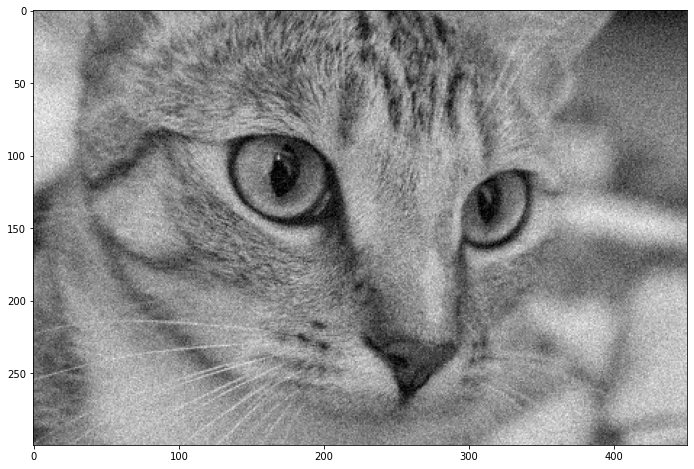

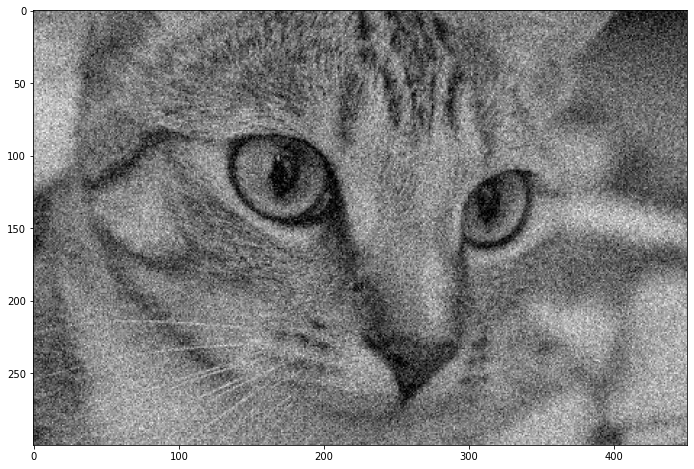

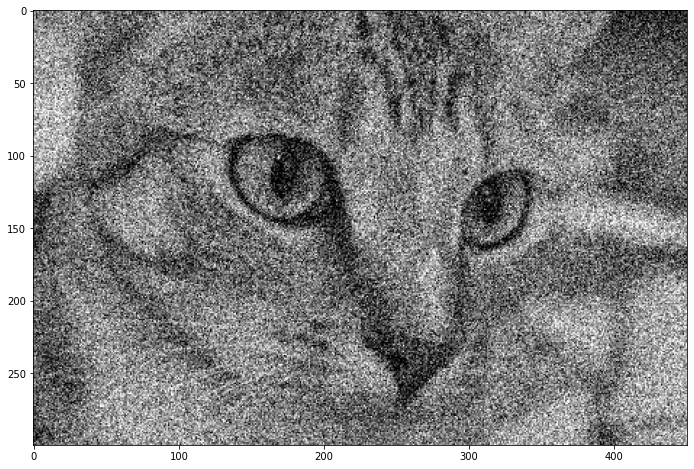

In [4]:
def gaussian_noise(img, std):
    return np.clip(img + np.random.normal(0, std, img.shape), 0, 1)

gaussian_noises = (0.05, 0.10, 0.2)
imgs_gaussian_noise = [gaussian_noise(img, s) for s in gaussian_noises]
for img_gaussian in imgs_gaussian_noise:
    plt.imshow(img_gaussian, cmap='gray')
    plt.show()

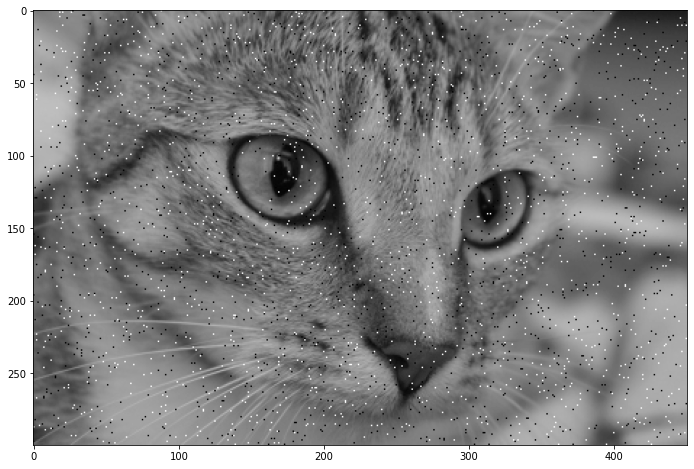

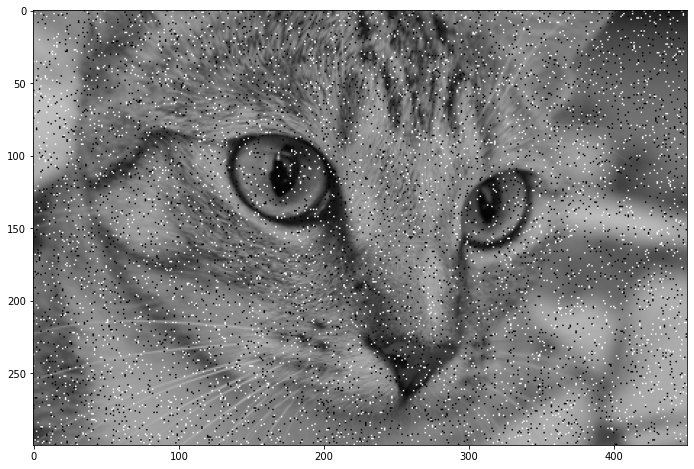

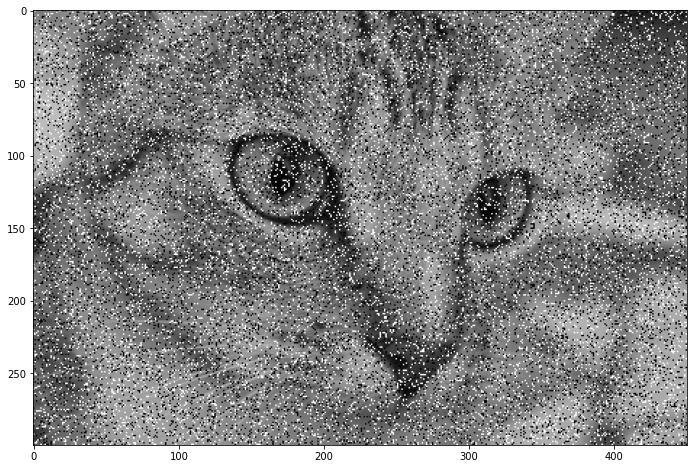

In [5]:
def salt_peper(img, p):
    peper_mask = np.random.binomial(1, p, img.shape).astype(np.bool)
    salt_mask = np.random.binomial(1, p, img.shape).astype(np.bool)
    img_noise = img.copy()
    img_noise[peper_mask] = 0
    img_noise[salt_mask] = 1
    return img_noise

salt_peper_noises = [0.01, 0.03, 0.1]
imgs_salt_peper = [salt_peper(img, p) for p in salt_peper_noises]
for img_salt_peper in imgs_salt_peper:
    plt.imshow(img_salt_peper, cmap='gray')
    plt.show()

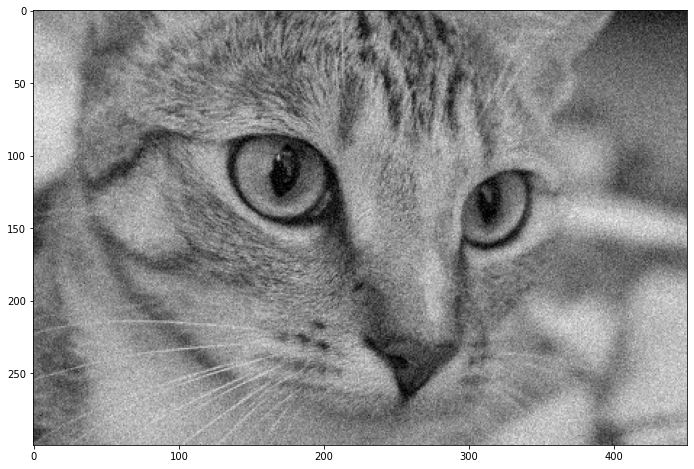

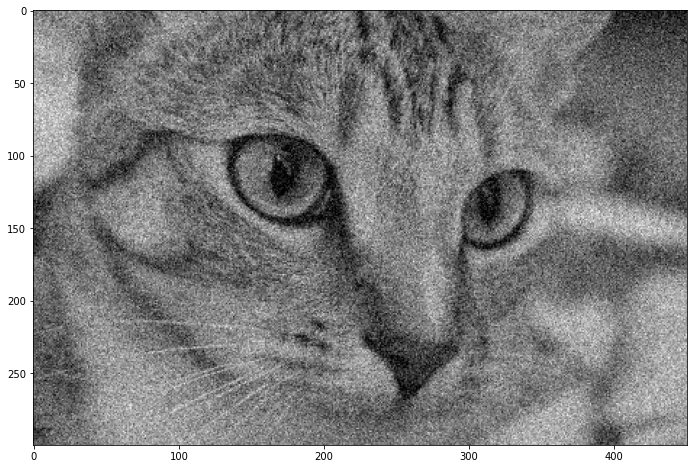

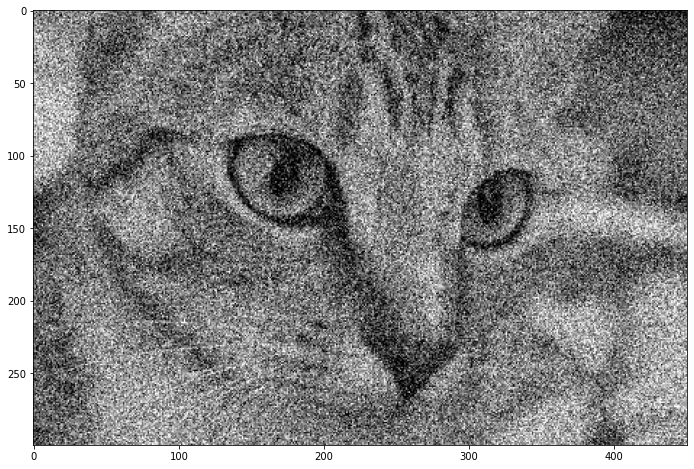

In [6]:
def gaussian_noise(img, std):
    return np.clip(img + np.random.normal(0, std, img.shape), 0, 1)

gaussian_noises = (0.05, 0.10, 0.2)
imgs_gaussian_noise = [gaussian_noise(img, s) for s in gaussian_noises]
for img_gaussian in imgs_gaussian_noise:
    plt.imshow(img_gaussian, cmap='gray')
    plt.show()

In [0]:
# implement the filters:

def arithmetic_mean(img):
    img1 = np.copy(img)
    w = 1./9.
    kernel = np.array([[w, w, w], [w,w,w], [w,w,w]])
    
    return scipy.signal.convolve2d(img1, kernel, mode='same')

def geometric_mean(img):
    img1 = np.copy(img)
    ksize = 3
    geomean = np.exp(arithmetic_mean(np.log(img1)))
    
    return geomean

def contraharmoic_mean(img, q=1):
    # we chose q=1 which reduces pepper noise better, if it would be 0 it would just 
    # be an arithmetic filter and if negative it would be better suitable for salt noise
    target = np.copy(img)

    for i in range(3,target.shape[0]-3):
        for j in range(3,target.shape[1]-3):
          kernel = np.median(np.array([[img[i-1,j-1], img[i-1,j], img[i-1,j+1]], 
                                      [img[i,j-1], img[i,j], img[i,j+1]], 
                                      [img[i+1,j-1], img[i+1,j], img[i+1,j+1]]]))
 
          count = np.sum(np.power(kernel, q+1)) / 9.0
          div = np.sum(np.power(kernel, q)) / 9.0
          target[i,j] = count / div
  
    target = np.clip(target,0,1)
    return target


def adaptive_mean(img):

    #  result image

    target = np.copy(img)


    smax = 25
    sxy = 9

    # iterate through image

    for i in range(3,target.shape[0]-3):
        for j in range(3,target.shape[1]-3):

          # selects the current array

          currentarray = np.array([[img[i-1,j-1], img[i-1,j], img[i-1,j+1]], 
                                      [img[i,j-1], img[i,j], img[i,j+1]], 
                                      [img[i+1,j-1], img[i+1,j], img[i+1,j+1]]])
          
          while (True):

            # get the mean, min, max and xz of current array

            zmean = np.mean(currentarray)
            zmin = np.min(currentarray)
            zmax = np.max(currentarray)
            zxy = img[i,j]

            # stage A

            a1 = zmean - zmin
            a2 = zmean - zmax

            if (a1>0 and a2<0):

              # stage B

              b1 = zxy - zmin
              b2 = zxy - zmax
                    
              if (b1 > 0 and b2 < 0):
                  target[i,j] = zxy
                  break
              else:
                  target[i,j] = zmean
                  break
                    
            elif (sxy < smax):
              sxy = smax
            else:
              target[i, j] = zmean
              break

    # clip result and return

    target = np.clip(target,0,1)
    return target

def adaptive_median(img):

    #  result image

    target = np.copy(img)


    smax = 25
    sxy = 9

    # iterate through image

    for i in range(3,target.shape[0]-3):
        for j in range(3,target.shape[1]-3):

          # selects the current array

          currentarray = np.array([[img[i-1,j-1], img[i-1,j], img[i-1,j+1]], 
                                      [img[i,j-1], img[i,j], img[i,j+1]], 
                                      [img[i+1,j-1], img[i+1,j], img[i+1,j+1]]])

          while (True):

            # get median, min, max and xy of current array

            zmedian = np.median(currentarray)
            zmin = np.min(currentarray)
            zmax = np.max(currentarray)
            zxy = img[i,j]

            #stage A

            a1 = zmedian - zmin
            a2 = zmedian - zmax

            if (a1>0 and a2<0):

              #stage B

              b1 = zxy - zmin
              b2 = zxy - zmax
                    
              if (b1 > 0 and b2 < 0):
                  target[i,j] = zxy
                  break
              else:
                  target[i,j] = zmedian
                  break
                    
            elif (sxy < smax):
              sxy = smax
            else:
              target[i, j] = zmedian
              break

    # clip result and return

    target = np.clip(target,0,1)
    return target

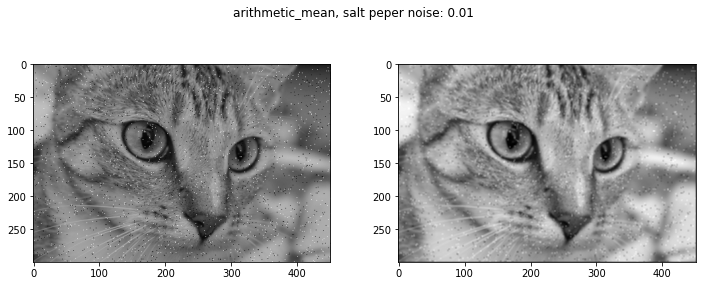

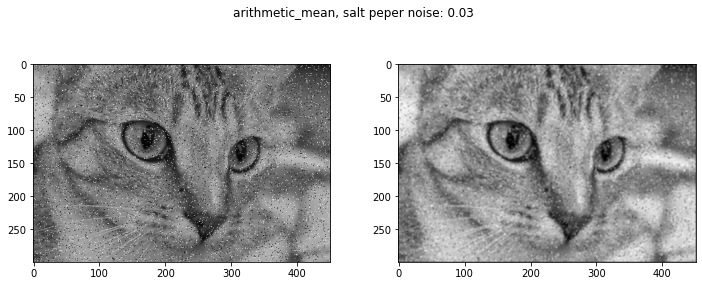

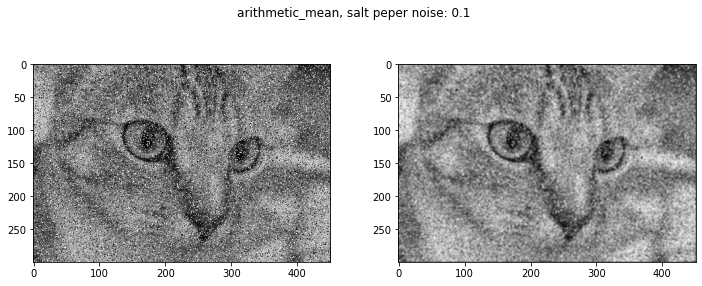

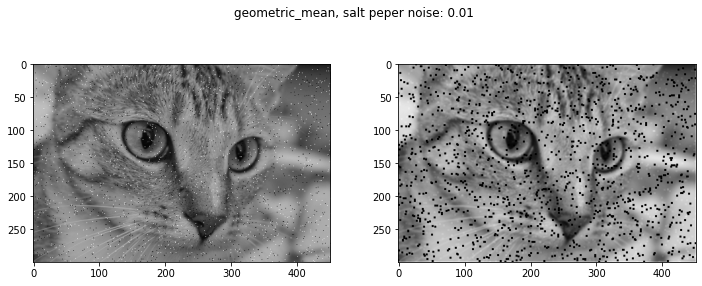

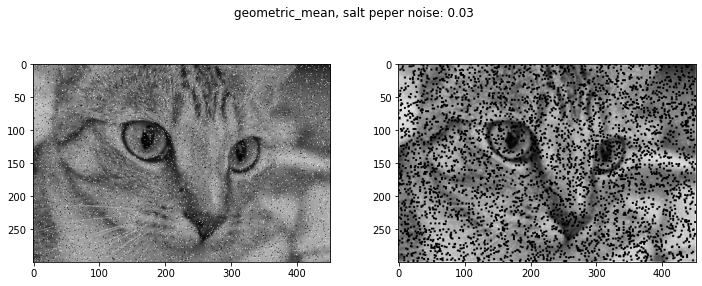

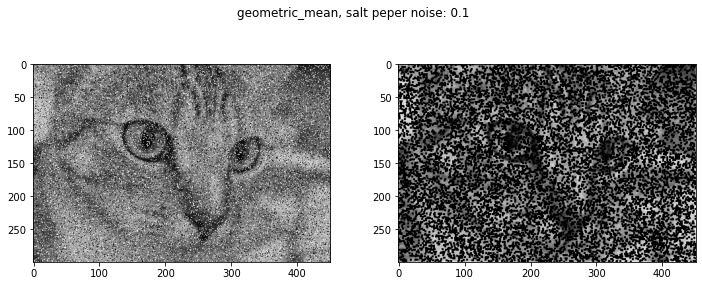

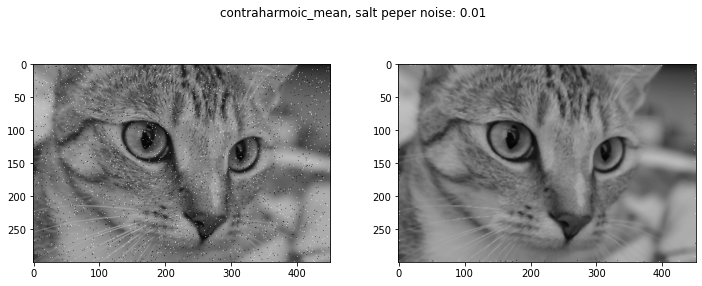

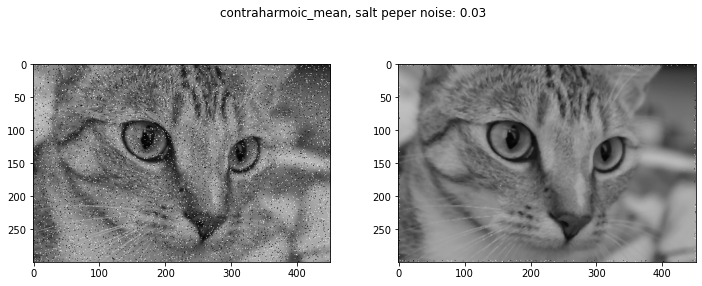

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in double_scalars


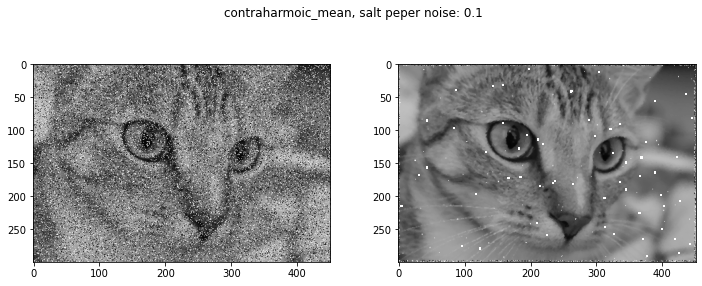

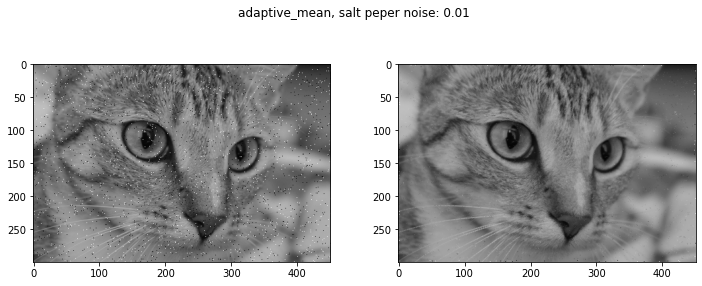

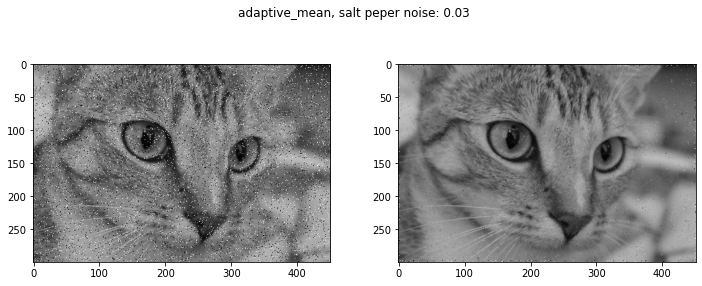

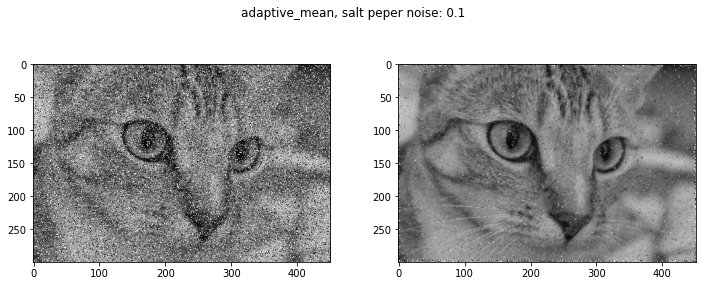

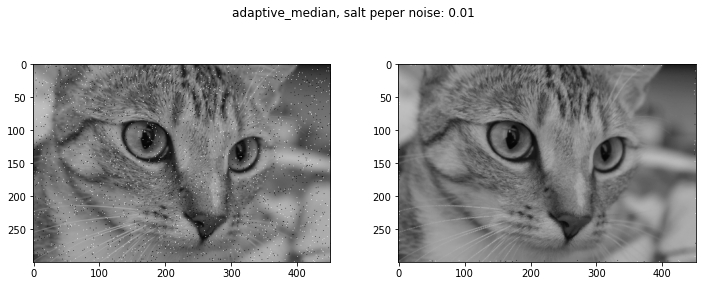

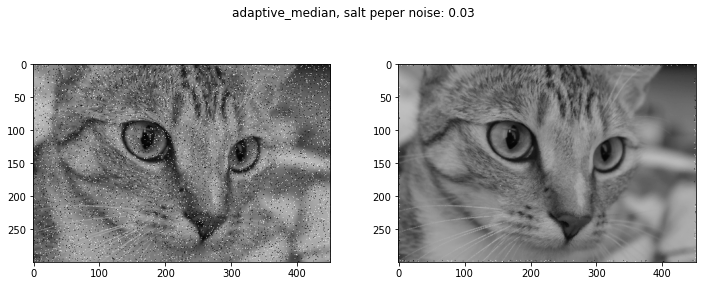

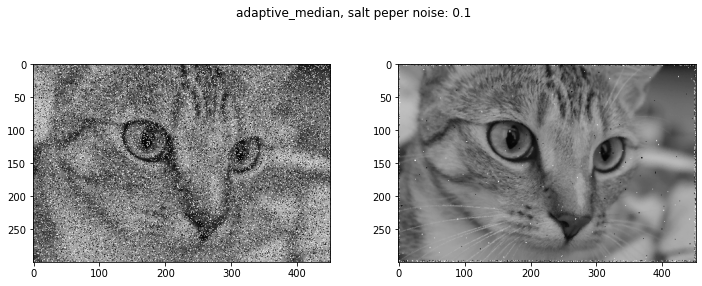

In [8]:
filters = [arithmetic_mean, geometric_mean, contraharmoic_mean, 
           adaptive_mean, adaptive_median]
for filter in filters:
    for sp, img_sp in zip(salt_peper_noises, imgs_salt_peper):
        plt.suptitle(filter.__name__ + ", salt peper noise: {}".format(sp))
        plt.subplot(221)
        plt.imshow(img_sp, cmap='gray')
        plt.subplot(222)
        plt.imshow(filter(img_sp.copy()), cmap='gray')
        plt.show()

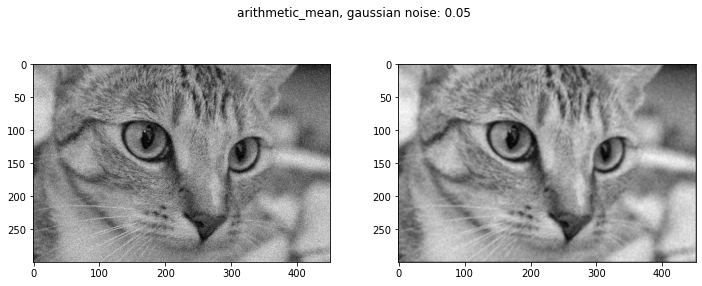

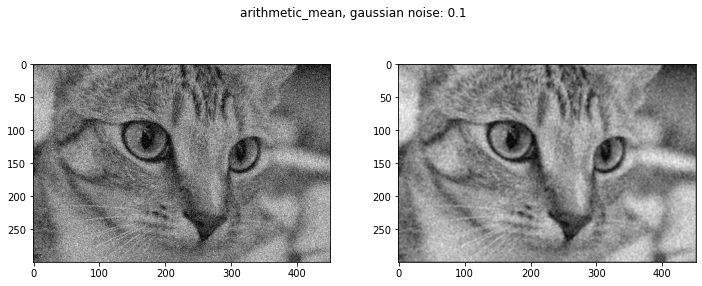

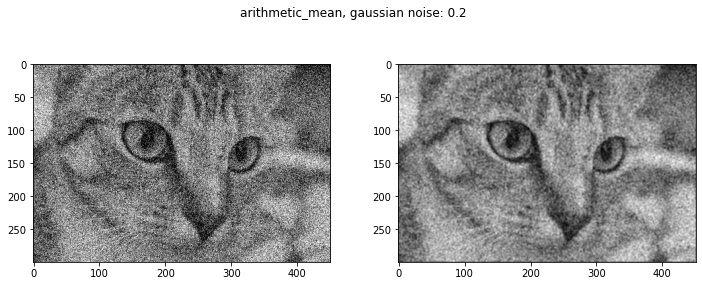

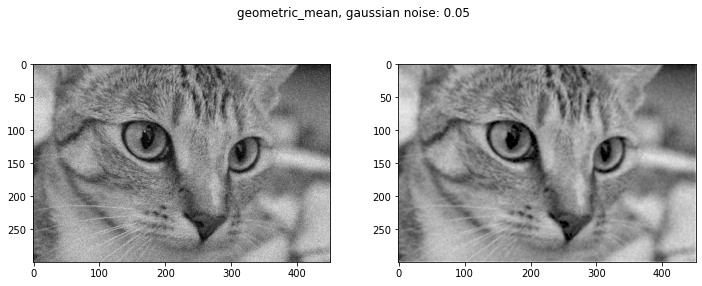

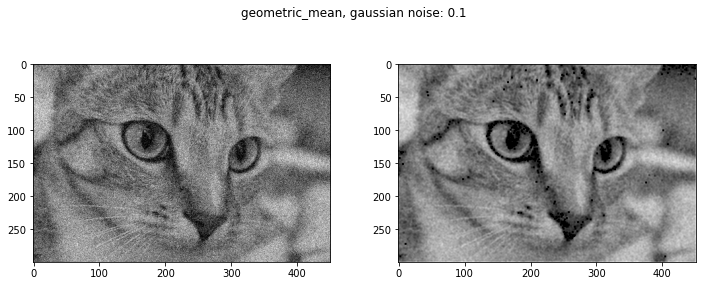

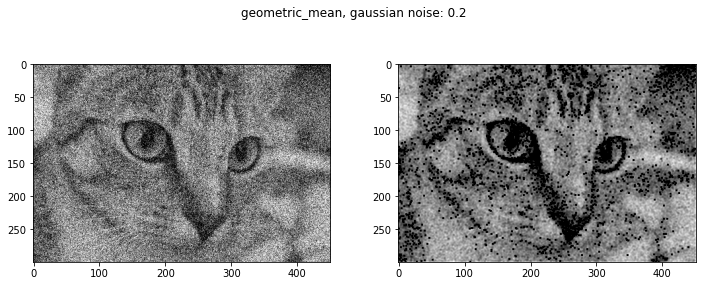

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in double_scalars


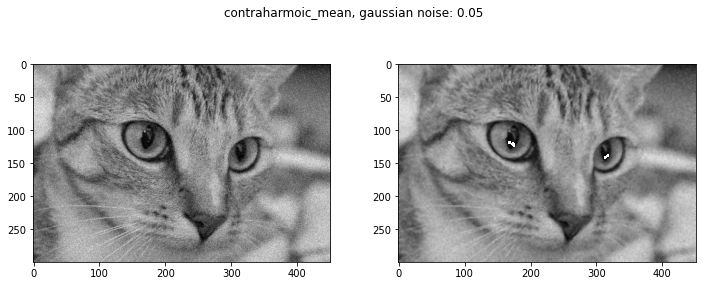

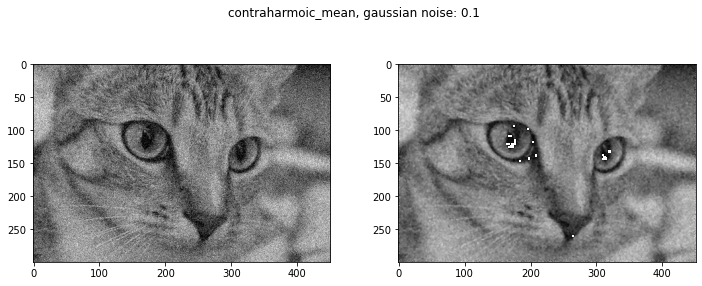

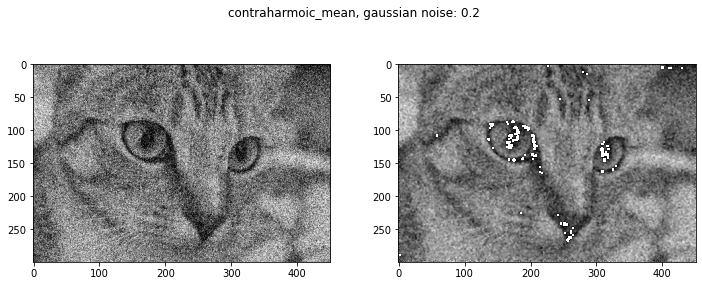

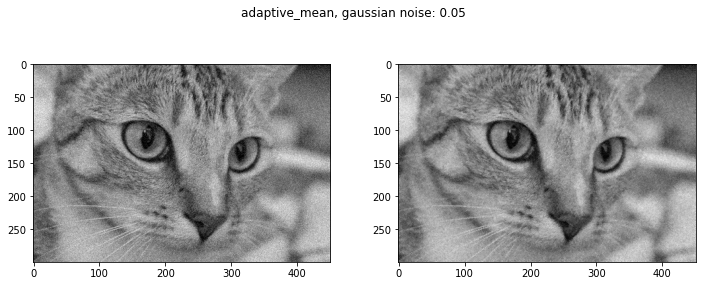

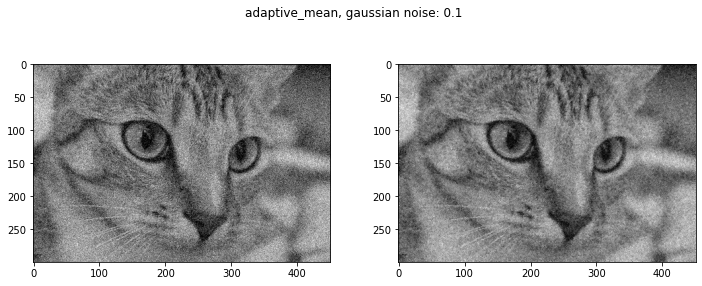

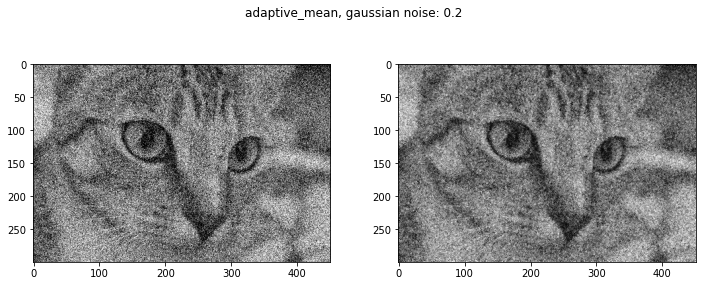

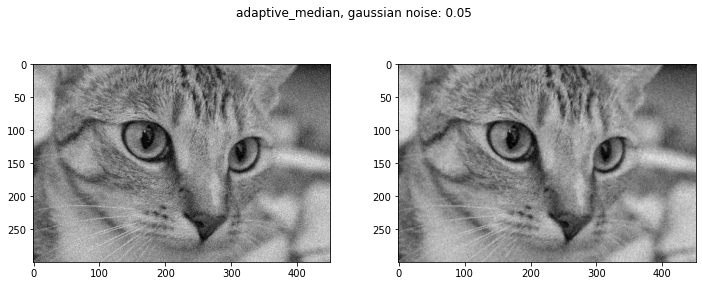

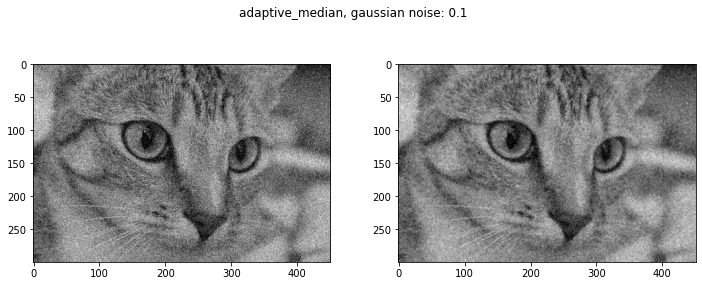

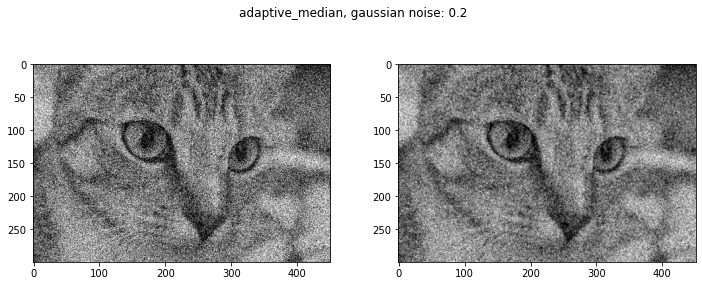

In [9]:
for filter in filters:
    for gn, img_gn in zip(gaussian_noises, imgs_gaussian_noise):
        plt.suptitle(filter.__name__ + ", gaussian noise: {}".format(gn))
        plt.subplot(221)
        plt.imshow(img_gn, cmap='gray')
        plt.subplot(222)
        plt.imshow(filter(img_gn.copy()), cmap='gray')
        plt.show()

# **Exercise 2 - Sharpening - 5 Points**


In [0]:
from skimage.filters import gaussian

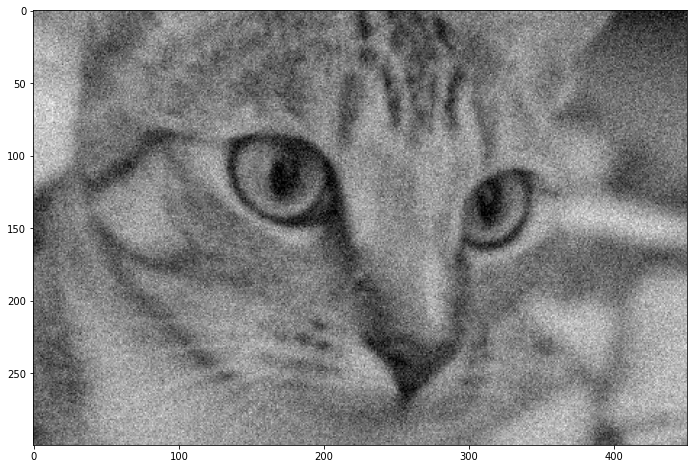

In [11]:
img_blurry = gaussian_noise(gaussian(img , 1.6), 0.07)
plt.imshow(img_blurry, cmap='gray')

In [0]:
def sharp_laplacian(img):
    """Perform sharpening with a laplacian filter"""

    # kernel

    kernel = np.array([[-1,-1,-1],
                      [-1,8,-1],
                      [-1,-1,-1]])
    
    # result image

    target = np.zeros_like(img)

    # using zero-padding

    target_padded = np.zeros((img.shape[0]+ 2, img.shape[1] + 2))
    target_padded[1:-1, 1:-1] = img

    # iterate through image

    for i in range(img.shape[1]):
      for j in range (img.shape[0]):
        target[j,i] = (kernel * target_padded[j:j+3,i:i+3]).sum()

    # return clipped image

    return np.clip(img + target,0,1)


In [0]:
def unsharp_masking(img):
    """Performce sharpening by unsharp masking"""

    # image - blurred image

    difference = img - gaussian(img) 

    # clipped image + difference

    return np.clip(img + difference*5,0,1)

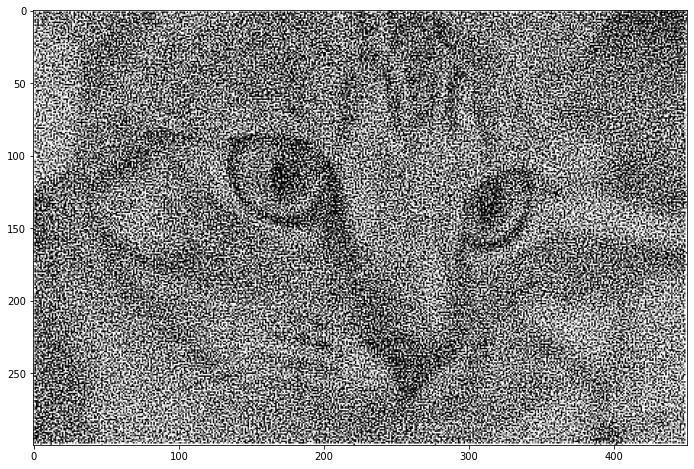

In [14]:
plt.imshow(sharp_laplacian(img_blurry), cmap='gray')
plt.show()

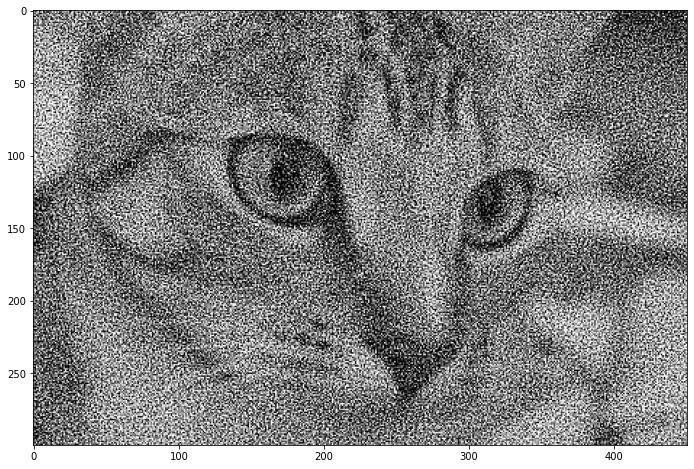

In [15]:
plt.imshow(unsharp_masking(img_blurry), cmap='gray')
plt.show()